1. サッカー動画を集める
2. 選手のトラッキング
3. ユニフォームの色によるチーム分け
4. 二次元鳥瞰図にマッピング
<br/>
else
5. ボールのトラッキング

6. 参考

- https://towardsdatascience.com/how-to-track-football-players-using-yolo-sort-and-opencv-6c58f71120b8
- https://github.com/KananVyas/PlayerDetection
- https://medium.com/@kananvyas/player-and-football-detection-using-opencv-python-in-fifa-match-6fd2e4e373f0
- https://www.researchgate.net/publication/331627725_An_Automated_Player_Detection_and_Tracking_in_Basketball_Game

In [139]:
import cv2
import numpy as np
from IPython.display import display, Image

In [140]:
def display_cv_image(image, format='.png'):
    decoded_bytes = cv2.imencode(format, image)[1].tobytes()
    display(Image(data=decoded_bytes))

In [141]:
vidcap = cv2.VideoCapture('input.mp4')
success,image = vidcap.read()
count = 0
success = True
idx = 0

In [142]:
image.shape

(1080, 1920, 3)

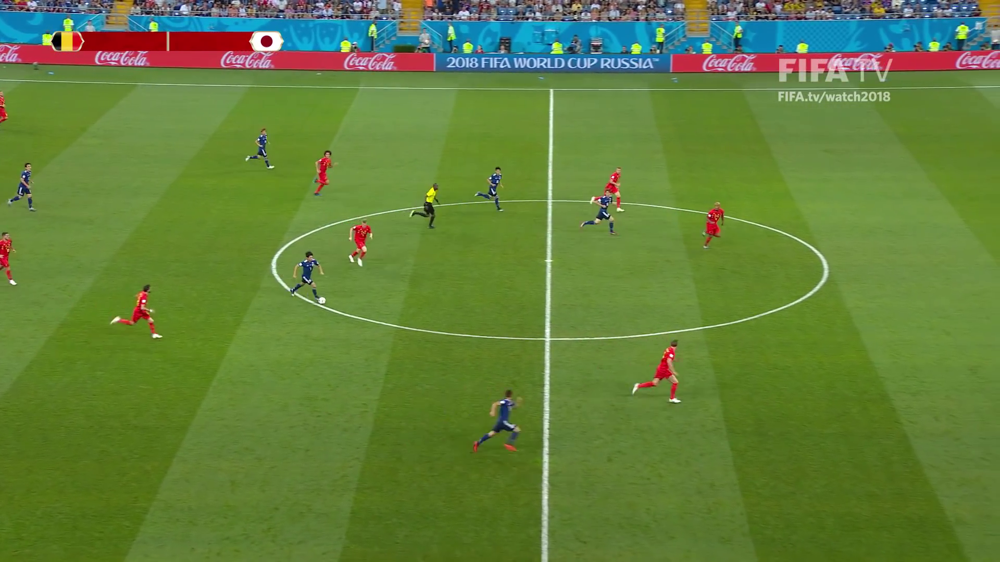

In [143]:
display_cv_image(image, '.png')

hsv image


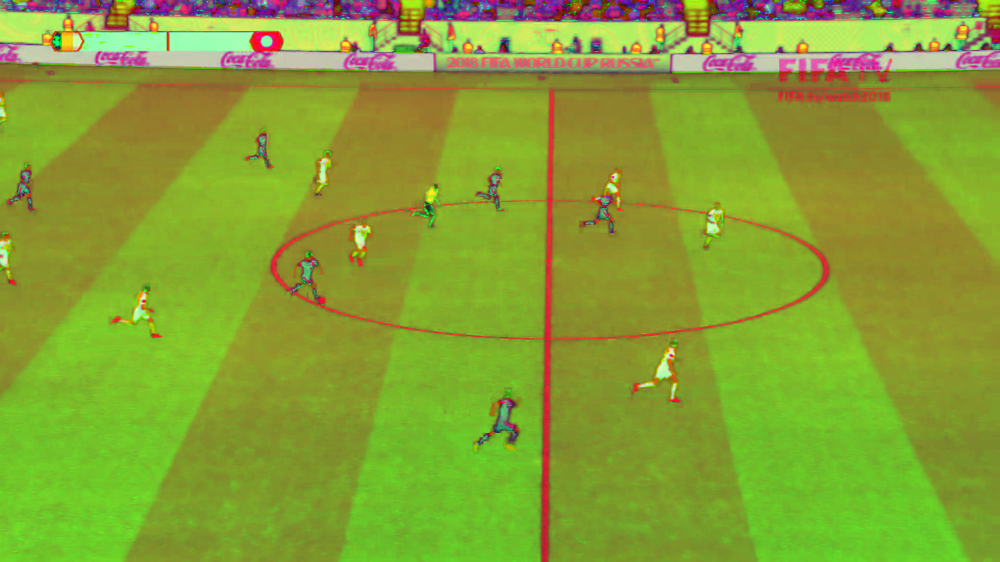

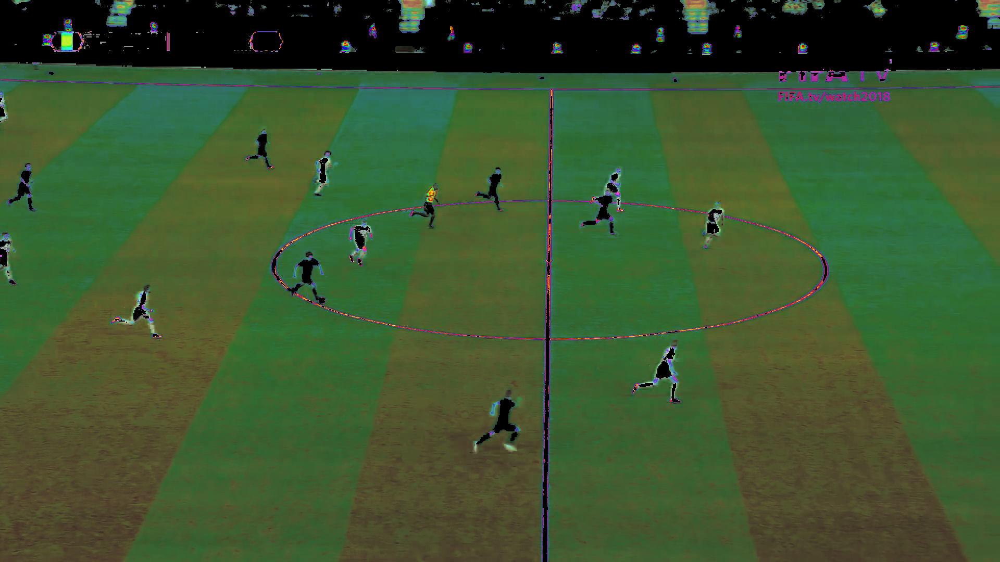

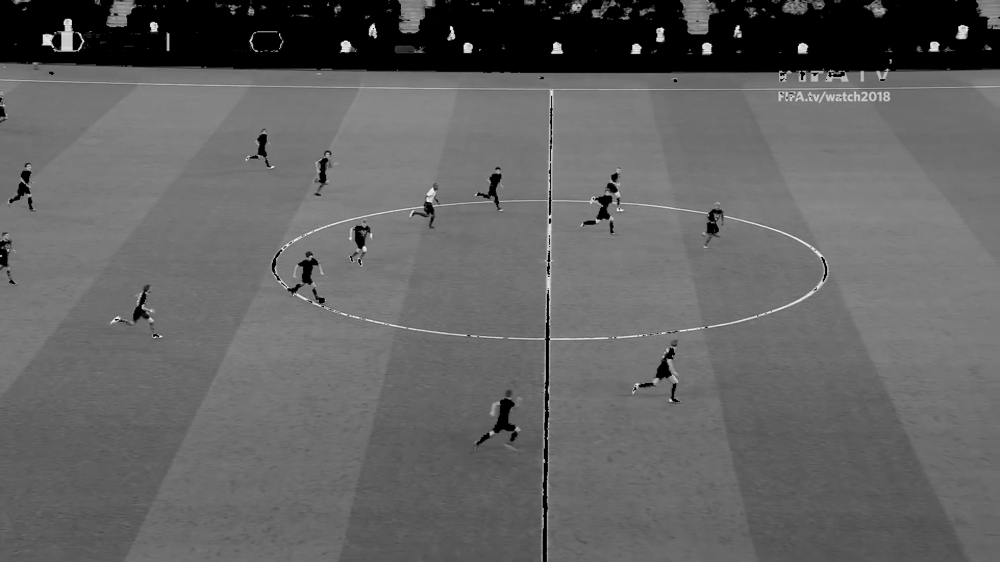

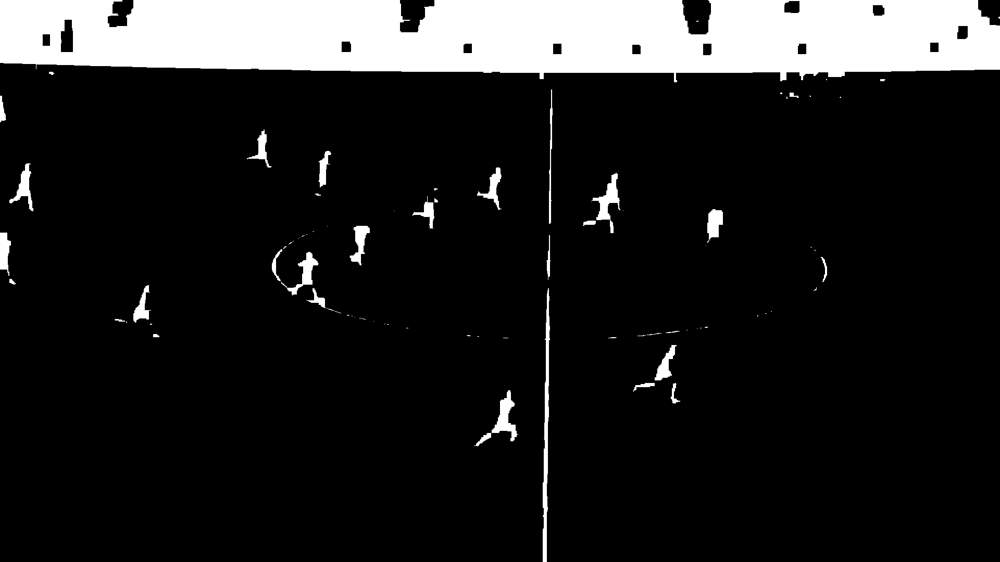

In [144]:
while success:
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    print("hsv image")
    display_cv_image(hsv, '.png')
    
    #green range
    lower_green = np.array([0,40, 40])
    upper_green = np.array([70, 255, 255])
    lower_red = np.array([0,31,255])
    upper_red = np.array([176,255,255])
    lower_blue = np.array([110,50,50])
    upper_blue = np.array([130,255,255])
    lower_white = np.array([0,0,0])
    upper_white = np.array([0,0,255])
    
    
    mask = cv2.inRange(hsv, lower_green, upper_green)
    res = cv2.bitwise_and(image, image, mask=mask)
    
    res_bgr = cv2.cvtColor(res,cv2.COLOR_HSV2BGR)
    display_cv_image(res_bgr, '.png')
    res_gray = cv2.cvtColor(res,cv2.COLOR_BGR2GRAY)
    display_cv_image(res_gray, '.png')
    
    kernel = np.ones((13,13),np.uint8)
    thresh = cv2.threshold(res_gray,127,255,cv2.THRESH_BINARY_INV |  cv2.THRESH_OTSU)[1]
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    display_cv_image(thresh, '.png')
    break

In [145]:
im2,contours,hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

In [146]:
for c in contours:
        x,y,w,h = cv2.boundingRect(c)
        if((w>20) and (h>= 20) and (h>=(1.1)*w)):
            print(w, h)
            cv2.rectangle(image,(x,y),(x+w,y+h),(0,0,255),3)

50 98
42 68
34 72
73 84
21 83
39 76
31 64
43 62
55 116
47 82
46 92
24 70
48 73
22 27
25 64


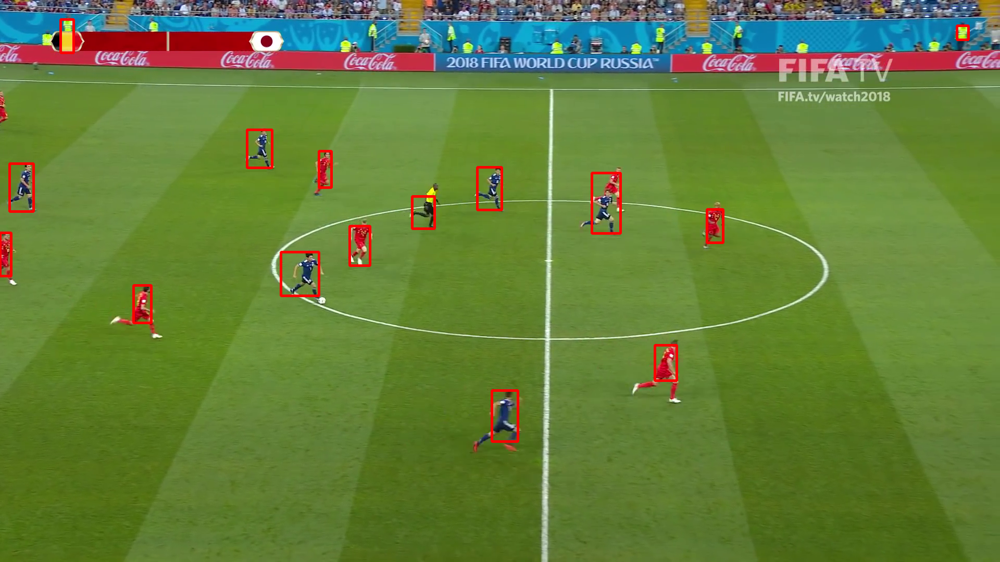

In [147]:
display_cv_image(image, '.png')

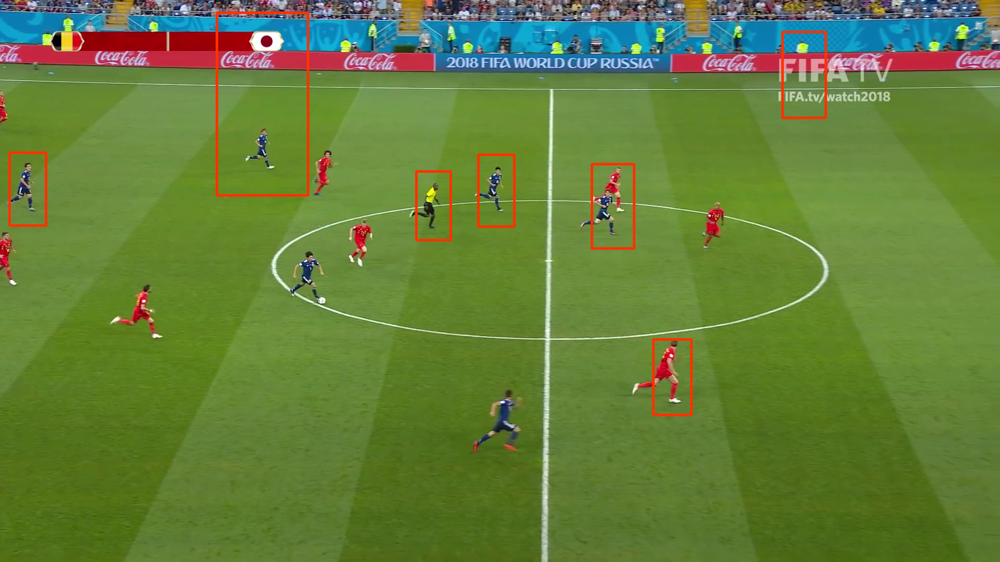

In [64]:
im = image.copy()

hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())
hogParams = {'winStride': (3, 3)}
human, r = hog.detectMultiScale(im, **hogParams)
for (x, y, w, h) in human:
    cv2.rectangle(im, (x, y),(x+w, y+h),(0,50,255), 3)

display_cv_image(im, '.png')

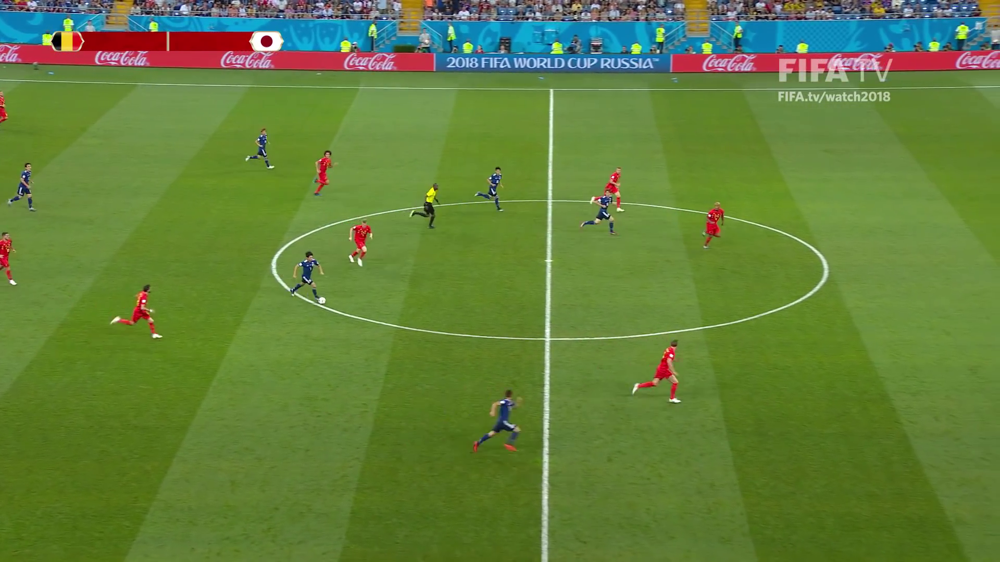

In [65]:
display_cv_image(image, '.png')